In [1]:
!module load devel/cuda/12.4
!export CUDA_LAUNCH_BLOCKING=1


The following have been reloaded with a version change:
  1) devel/cuda/11.8 => devel/cuda/12.4



In [2]:
import os
# print(os.getcwd())
os.chdir('/pfs/data5/home/ma/ma_ma/ma_kreffert/Interpretable-Deep-Fake-Detection/training')
# print(os.getcwd())

In [3]:
import yaml
import torch
torch.cuda.empty_cache()
torch.cuda.reset_peak_memory_stats()
torch.cuda.set_device(0)
os.environ['CUDA_LAUNCH_BLOCKING'] = '1'

import sys
# os.environ["CUDA_VISIBLE_DEVICES"] = "" 
sys.argv = ["train.py"]
from train import init_seed, prepare_training_data, prepare_testing_data, choose_optimizer, choose_scheduler, choose_metric
import torch.backends.cudnn as cudnn
import torch.distributed as dist
from datetime import timedelta
from detectors import DETECTOR
from trainer.trainer import Trainer


def load_config(path, additional_args = {}):
    # parse options and load config
    with open(path, 'r') as f:
        config = yaml.safe_load(f)
    try:# KAI: added this, to ensure it finds the config file
        with open('./training/config/train_config.yaml', 'r') as f:
            config2 = yaml.safe_load(f)
    except FileNotFoundError:
        with open(os.path.expanduser('~/Interpretable-Deep-Fake-Detection/training/config/train_config.yaml'), 'r') as f:
            config2 = yaml.safe_load(f)
    if 'label_dict' in config:
        config2['label_dict']=config['label_dict']
    config.update(config2)
    # config['local_rank']=args.local_rank
    if config['dry_run']:
        config['nEpochs'] = 0
        config['save_feat']=False
    for key, value in additional_args.items():
        config[key] = value
    return config


path = "./config/detector/resnet34_bcos.yaml"
additional_args = {'test_batchSize': 4}
config = load_config(path, additional_args=additional_args)

2025-03-17 14:59:48.485604: I tensorflow/core/util/port.cc:111] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2025-03-17 14:59:49.252130: E tensorflow/compiler/xla/stream_executor/cuda/cuda_dnn.cc:9342] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2025-03-17 14:59:49.252165: E tensorflow/compiler/xla/stream_executor/cuda/cuda_fft.cc:609] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2025-03-17 14:59:49.252197: E tensorflow/compiler/xla/stream_executor/cuda/cuda_blas.cc:1518] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2025-03-17 14:59:49.269819: I tensorflow/core/platform/cpu_feature_g

In [4]:
from test import test_epoch, test_one_dataset, test_epoch, inference
from tqdm import tqdm
import random
# init seed
# init_seed(config)

torch.manual_seed(34)
random.seed(34)
torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False  # Disable for strict reproducibility


# prepare the testing data loader
test_data_loaders = prepare_testing_data(config)

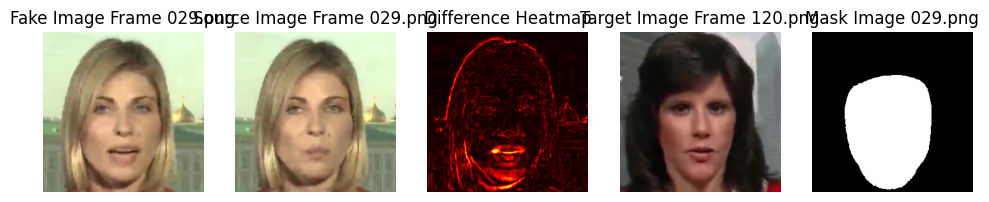

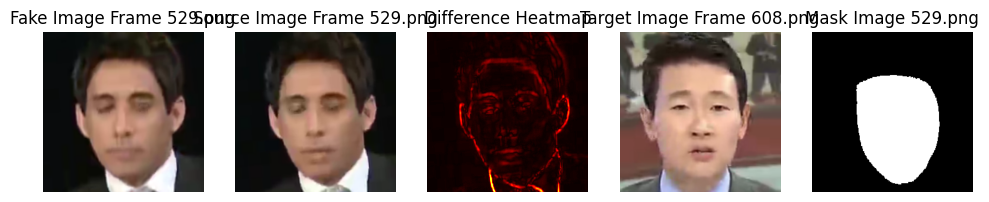

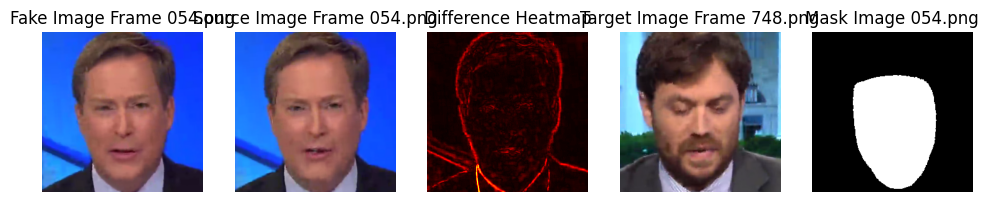

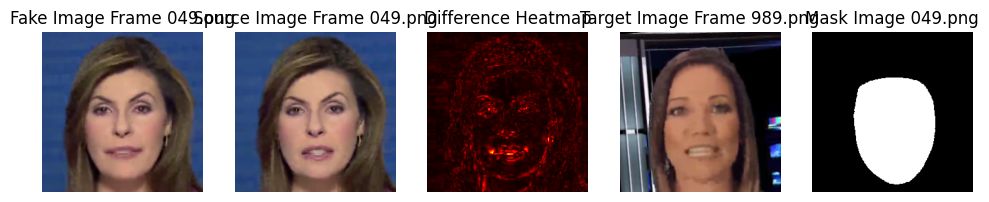

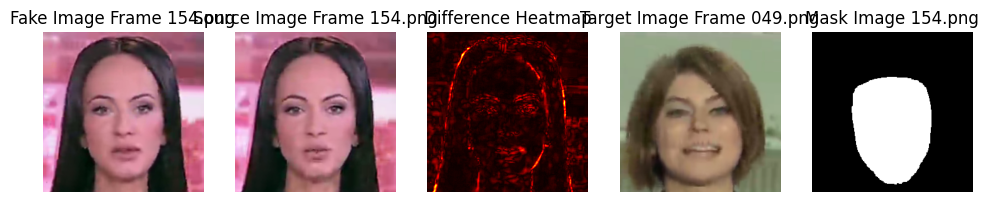

...

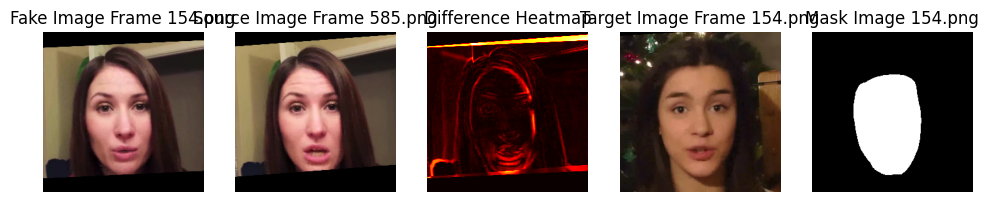

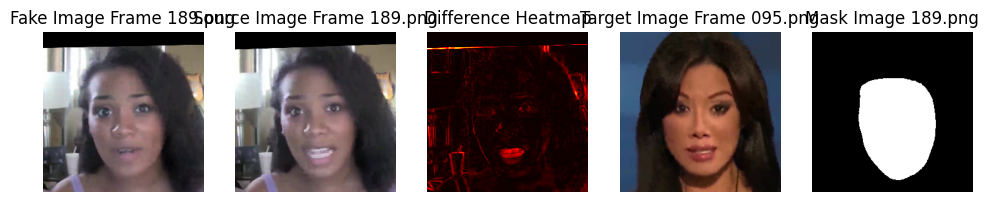

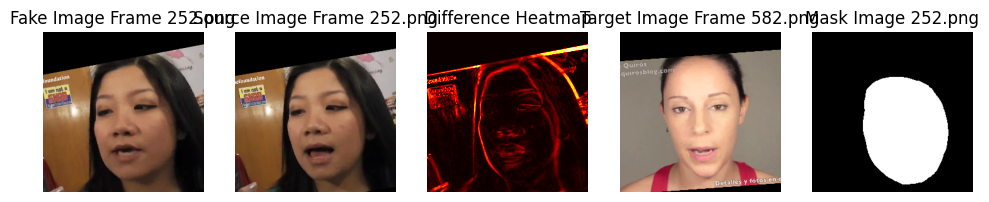

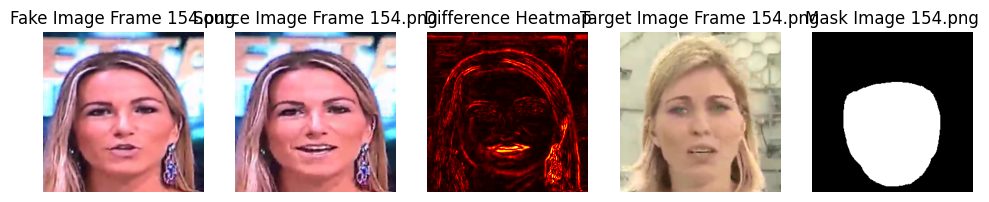

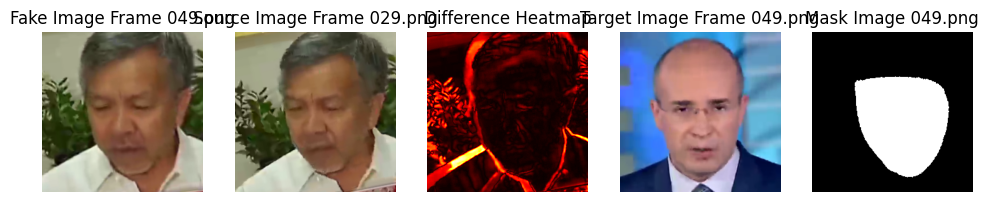

In [5]:
import os
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

# Define the base path
base_path = "/pfs/work7/workspace/scratch/ma_tischuet-team_project_explainable_deepfakes/datasets/rgb/"

# Define function to get all .png files in a folder
def get_image_paths(folder_paths):
    images = []
    for folder_path in list(folder_paths):
        # Get all files in the folder and filter for .png files
        images.extend([os.path.join(folder_path, f) for f in os.listdir(folder_path) if f.endswith('.png')])
    return images

combinations = ['615_687', '995_233', '612_702', '618_629', '670_661', '829_808'  ,'882_952'  ,'935_733'  ,'988_966',
               '018_019',  '071_054',  '124_085',  '177_211',  '230_204',  '284_263',  '337_522',  '390_709',  '443_514',  '496_417',
                '406_391',  '459_430',  '512_495',  '565_589',  '619_620',  '672_720',  '725_724',  '778_798',  '831_508',  '884_968',  '937_888']
for v in combinations:
    # Specify the folders
    fakes_folder = f'{base_path}FaceForensics++/manipulated_sequences/NeuralTextures/c40/frames/{v}/'
    source_folder = f'{base_path}FaceForensics++/original_sequences/youtube/c40/frames/{v[0:3]}/'
    target_folder = f'{base_path}FaceForensics++/original_sequences/youtube/c40/frames/{v[4:]}/'
    masks_folder = f'{base_path}FaceForensics++/manipulated_sequences/NeuralTextures/c40/masks/{v}/'
    
    # Get the image paths for both folders
    fakes_paths = get_image_paths([fakes_folder])  # Pass folder paths as a list
    source_paths = get_image_paths([source_folder])
    target_paths = get_image_paths([target_folder])
    masks_paths = get_image_paths([masks_folder])
    
    if not fakes_paths or not source_paths:
        print(f"Skipping {v}, missing images")
        continue

    # Read images
    fake_img = mpimg.imread(fakes_paths[0])  # First fake image
    source_img = mpimg.imread(source_paths[0])  # First source image
    target_img = mpimg.imread(target_paths[0])  # First source image
    mask_img = mpimg.imread(masks_paths[0])  # First source image

    # Ensure images are the same size
    if fake_img.shape != source_img.shape:
        print(f"Skipping {v}, image sizes don't match")
        continue

    # Compute absolute difference (delta)
    delta = np.abs(fake_img.astype(np.float32) - source_img.astype(np.float32))

    # Convert RGB to grayscale if needed (optional)
    delta_gray = np.mean(delta, axis=2) if delta.ndim == 3 else delta

    # Display the fake image
    plt.figure(figsize=(12, 4))
    plt.subplot(1, 5, 1)
    plt.imshow(fake_img)
    plt.axis('off')
    plt.title(f'Fake Image Frame {fakes_paths[0][-7:]}')

    # Display the source image
    plt.subplot(1, 5, 2)
    plt.imshow(source_img)
    plt.axis('off')
    plt.title(f'Source Image Frame {source_paths[0][-7:]}')

    # Display the delta as a heatmap
    plt.subplot(1, 5, 3)
    plt.imshow(delta_gray, cmap='hot')  # 'hot' or 'viridis' for better visualization
    plt.axis('off')
    plt.title('Difference Heatmap')

    # Display the delta as a heatmap
    plt.subplot(1, 5, 4)
    plt.imshow(target_img, cmap='hot')  # 'hot' or 'viridis' for better visualization
    plt.axis('off')
    plt.title(f'Target Image Frame {target_paths[0][-7:]}')

    # Display the delta as a heatmap
    plt.subplot(1, 5, 5)
    plt.imshow(mask_img)  # 'hot' or 'viridis' for better visualization
    plt.axis('off')
    plt.title(f'Mask Image {masks_paths[0][-7:]}')

    plt.show()


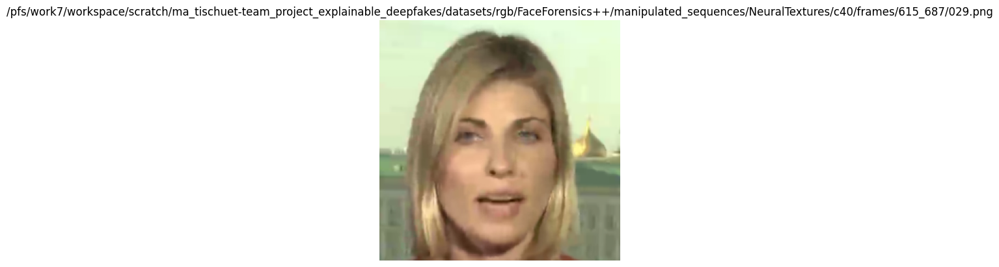

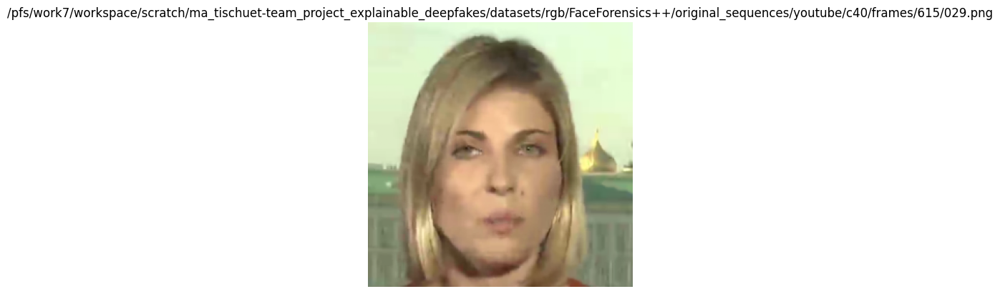

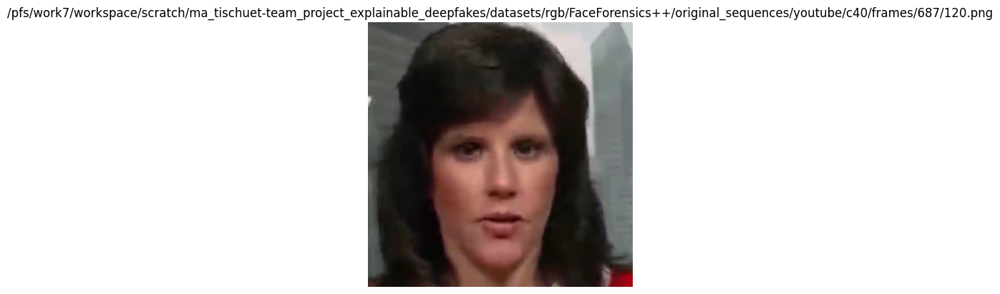

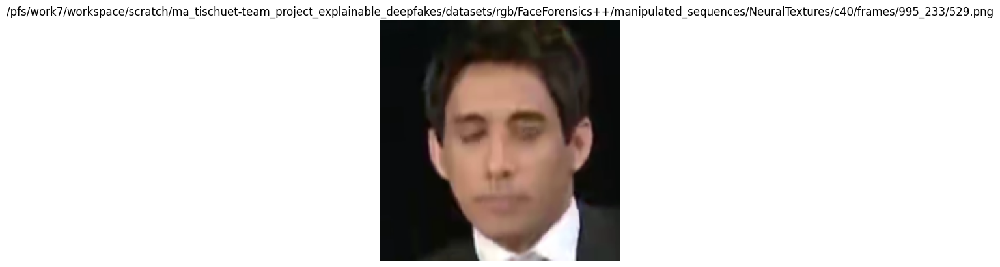

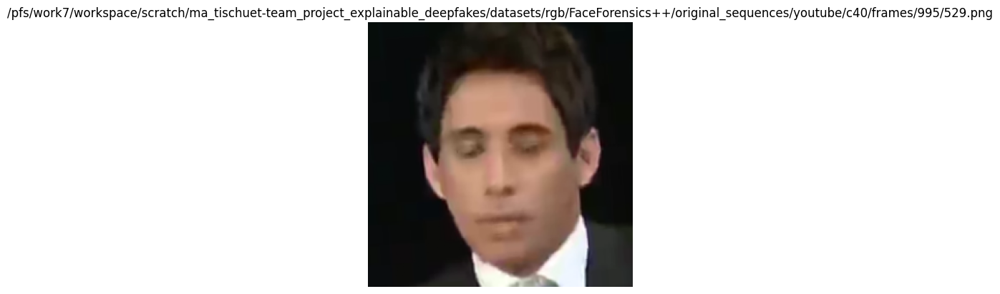

...

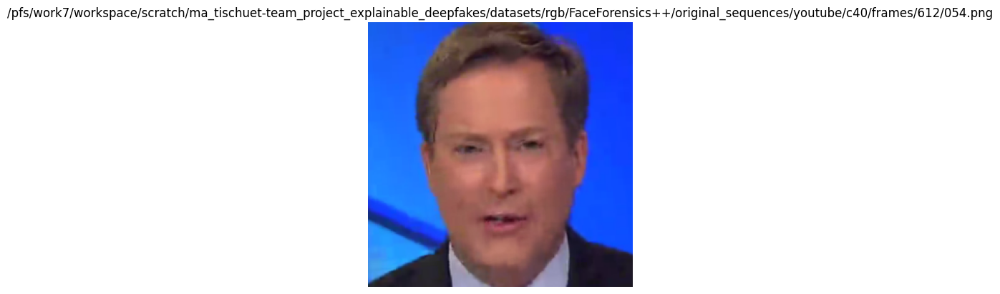

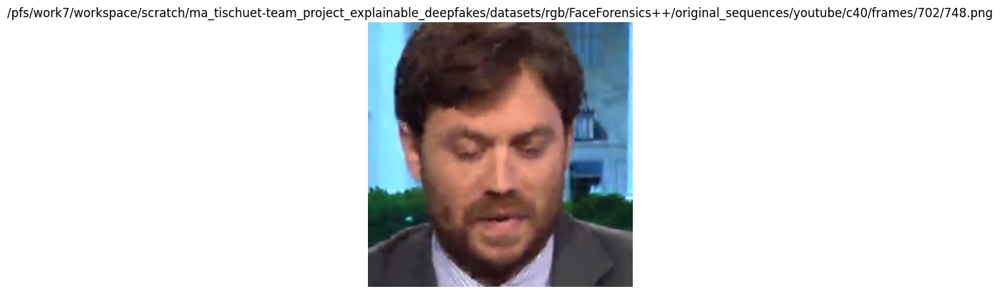

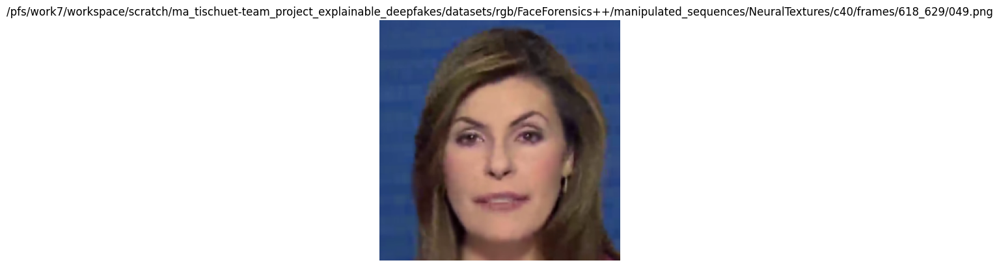

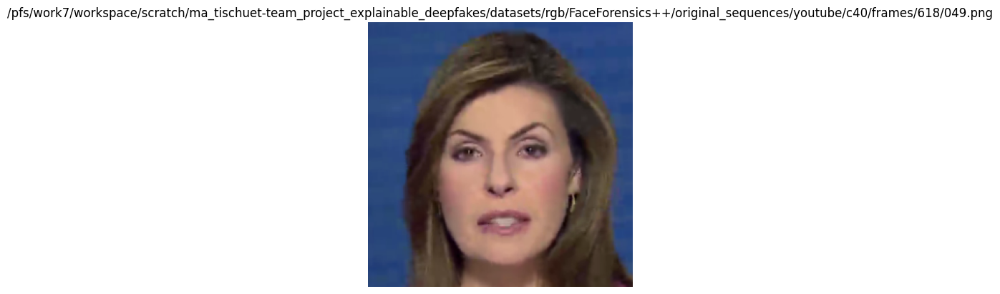

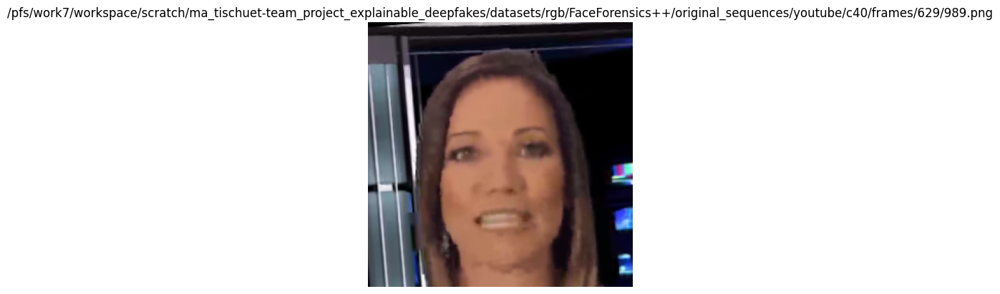

In [39]:
import os
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

# Define the base path
base_path = "/pfs/work7/workspace/scratch/ma_tischuet-team_project_explainable_deepfakes/datasets/rgb/"

# Define function to get all .png files in a folder
def get_image_paths(folder_paths):
    images = []
    for folder_path in list(folder_paths):
        # Get all files in the folder and filter for .png files
        images.extend([os.path.join(folder_path, f) for f in os.listdir(folder_path) if f.endswith('.png')])
    return images

source_image = 233615_687
combinations = ['615_687', '995_233', '612_702', '618_629']
for v in combinations:
    # Specify the folders
    fakes_folder = f'{base_path}FaceForensics++/manipulated_sequences/NeuralTextures/c40/frames/{v}/'
    source_folder = f'{base_path}FaceForensics++/original_sequences/youtube/c40/frames/{v[0:3]}/'
    target_folder = f'{base_path}FaceForensics++/original_sequences/youtube/c40/frames/{v[4:]}/'
    
    # Get the image paths for both folders
    fakes_paths = get_image_paths([fakes_folder])  # Pass folder paths as a list
    source_paths = get_image_paths([source_folder])
    target_paths = get_image_paths([target_folder])
    
    all_paths = []
    positions = [0]
    for pos in positions:
        all_paths.append(fakes_paths[pos])
        all_paths.append(source_paths[pos])
        all_paths.append(target_paths[pos])

    
    
    # Display all images
    for path in all_paths:
        img = mpimg.imread(path)
        plt.imshow(img)
        plt.axis('off')  # Hide axes
        plt.title(path)
        plt.show()

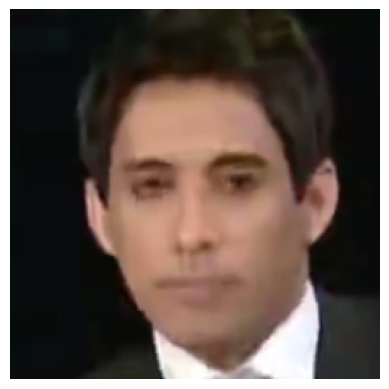

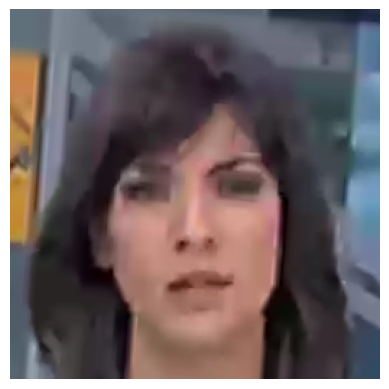

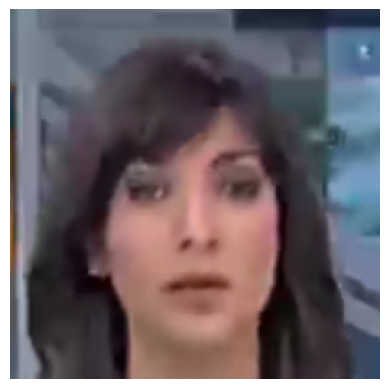

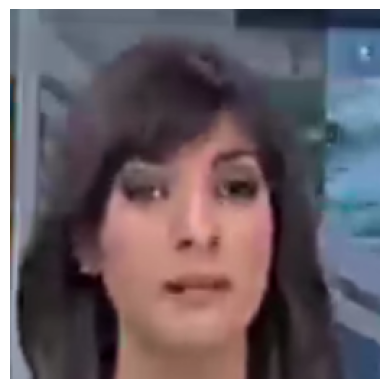

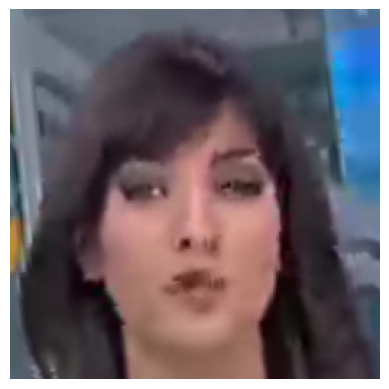

...

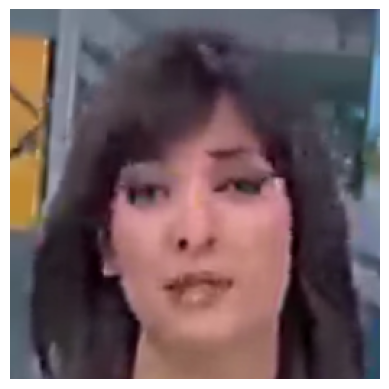

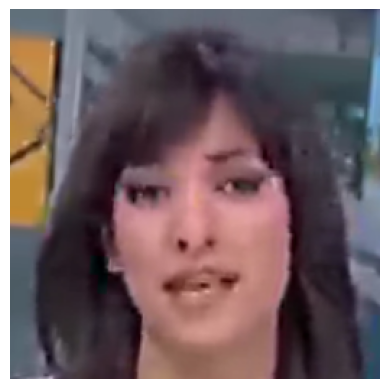

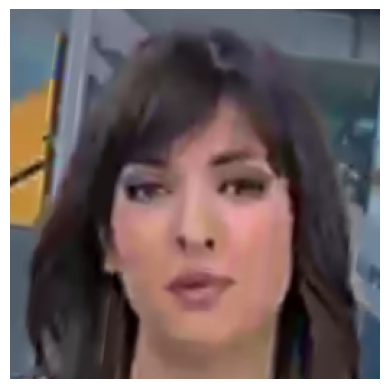

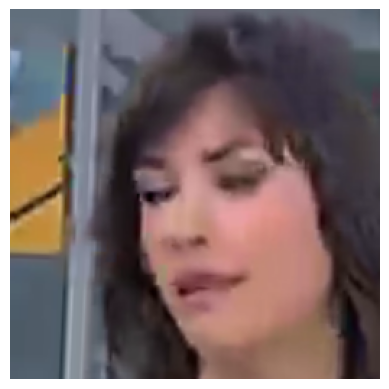

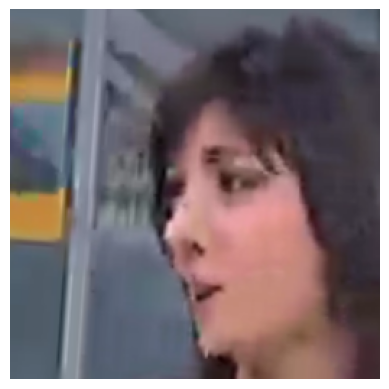

In [11]:
from PIL import Image
base_path = "/pfs/work7/workspace/scratch/ma_tischuet-team_project_explainable_deepfakes/datasets/rgb/"
fakes_paths= [f'{base_path}FaceForensics++/manipulated_sequences/NeuralTextures/c40/frames/995_233/547.png']
reals_paths = [f'{base_path}FaceForensics++/original_sequences/youtube/c40/frames/990/{img}.png' for img in ["000", "019", "039", "058", "078", "098", "117",  "137",  "156",  "176",  "196",  "215",  "235",  "254",  "274",  "294",
"009",  "029",  "049",  "068",  "088",  "107",  "127",  "147",  "166",  "186",  "205",  "225",  "245",  "264",  "284",  "304",]]

import matplotlib.pyplot as plt
import matplotlib.image as mpimg
for path in fakes_paths + reals_paths:
    # Read and display the image
    img = mpimg.imread(path)
    plt.imshow(img)
    plt.axis('off')  # Hide axes if you don't want them to show
    plt.show()

In [7]:
keys = test_data_loaders.keys()
for key in keys:
    print(key)
    data_dict = test_data_loaders[key].dataset.data_dict
    print(data_dict['image'][:10])
    # for i, data_dict in tqdm(enumerate(test_data_loaders[key]),total=len(test_data_loaders[key])):

FaceForensics++
('/pfs/work7/workspace/scratch/ma_tischuet-team_project_explainable_deepfakes/datasets/rgb/FaceForensics++/manipulated_sequences/NeuralTextures/c40/frames/995_233/547.png', '/pfs/work7/workspace/scratch/ma_tischuet-team_project_explainable_deepfakes/datasets/rgb/FaceForensics++/manipulated_sequences/NeuralTextures/c40/frames/000_003/243.png', '/pfs/work7/workspace/scratch/ma_tischuet-team_project_explainable_deepfakes/datasets/rgb/FaceForensics++/manipulated_sequences/Deepfakes/c40/frames/015_919/239.png', '/pfs/work7/workspace/scratch/ma_tischuet-team_project_explainable_deepfakes/datasets/rgb/FaceForensics++/original_sequences/youtube/c40/frames/423/1637.png', '/pfs/work7/workspace/scratch/ma_tischuet-team_project_explainable_deepfakes/datasets/rgb/FaceForensics++/original_sequences/youtube/c40/frames/669/031.png', '/pfs/work7/workspace/scratch/ma_tischuet-team_project_explainable_deepfakes/datasets/rgb/FaceForensics++/manipulated_sequences/NeuralTextures/c40/frames/3

In [ ]:
# prepare the model (detector)
model_class = DETECTOR[config['model_name']]
model = model_class(config)

model.cuda()#.to("cuda:0")
print(next(model.parameters()).device)

model.eval()
# testing for all test data
keys = test_data_loaders.keys()
for key in keys:
    print(key)
    data_dict = test_data_loaders[key].dataset.data_dict
    for i, data_dict in tqdm(enumerate(test_data_loaders[key]),total=len(test_data_loaders[key])):
        if i < 3:
            if 'label_spe' in data_dict:
                data_dict.pop('label_spe')  # remove the specific label
            data_dict['label'] = torch.where(data_dict['label']!=0, 1, 0)  # fix the label to 0 and 1 only
            # move data to GPU elegantly
            for key in data_dict.keys():
                if data_dict[key]!=None:
                    data_dict[key]=data_dict[key].cuda()
            # model forward without considering gradient computation
            # print(data_dict)
            with torch.no_grad():
                predictions = inference(model, data_dict)
            print(data_dict['label'])
            print(predictions['prob'])
        else:
            break